In [1]:
import sklearn
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

from IPython.display import display, Markdown, Latex

# Анализ выборки

## Breast Cancer Wisconsin (Diagnostic) Dataset

Выборка взята отсюда: https://archive.ics.uci.edu/dataset/17/breast+cancer+wisconsin+diagnostic

In [2]:
from sklearn.datasets import load_breast_cancer
data = load_breast_cancer(as_frame = True)
df = data['frame']
features = data['feature_names']

display(Markdown(f'Размер выборки составляет $l={len(df)}$ объектов. Кол-во признаков $n={len(features)}$.'))
display(Markdown('Фрагмент датасета:'))

df.sample(5, random_state = 0)

Размер выборки составляет $l=569$ объектов. Кол-во признаков $n=30$.

Фрагмент датасета:

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
512,13.40,20.52,88.64,556.7,0.11060,0.14690,0.14450,0.08172,0.2116,0.07325,...,29.66,113.30,844.4,0.15740,0.38560,0.51060,0.20510,0.3585,0.11090,0
457,13.21,25.25,84.10,537.9,0.08791,0.05205,0.02772,0.02068,0.1619,0.05584,...,34.23,91.29,632.9,0.12890,0.10630,0.13900,0.06005,0.2444,0.06788,1
439,14.02,15.66,89.59,606.5,0.07966,0.05581,0.02087,0.02652,0.1589,0.05586,...,19.31,96.53,688.9,0.10340,0.10170,0.06260,0.08216,0.2136,0.06710,1
298,14.26,18.17,91.22,633.1,0.06576,0.05220,0.02475,0.01374,0.1635,0.05586,...,25.26,105.80,819.7,0.09445,0.21670,0.15650,0.07530,0.2636,0.07676,1
37,13.03,18.42,82.61,523.8,0.08983,0.03766,0.02562,0.02923,0.1467,0.05863,...,22.81,84.46,545.9,0.09701,0.04619,0.04833,0.05013,0.1987,0.06169,1


## Множество ответов

Множество ответов состоит из 2 элементов: 
- WDBC-Malignant (Злокачественный)
- WDBC-Benign (Доброкачественный)

## Типы признаков

База данных по раку молочной предлагает следующий вещественный набор основных параметров:

- radius (mean of distances from center to points on the perimeter)
- texture (standard deviation of gray-scale values)
- perimeter
- area
- smoothness (local variation in radius lengths)
- compactness (perimeter^2 / area - 1.0)
- concavity (severity of concave portions of the contour)
- concave points (number of concave portions of the contour)
- symmetry
- fractal dimension (“coastline approximation” - 1)

Набор признаков включает в себя производные от описанных выше параметров: 
- *mean* (среднее значение параметра) 
- *standard error* (ошибка определения среднего) 
- *worst* (максимальное/наибольшее значение параметра при измерении)

Итого получаем 30 признаков в датасете. 

## Визуальный анализ данных

### Матрица корреляции

Рассмотрим корреляцию признаков:

- Геометрические размеры, очевидно, коррелируют между собой

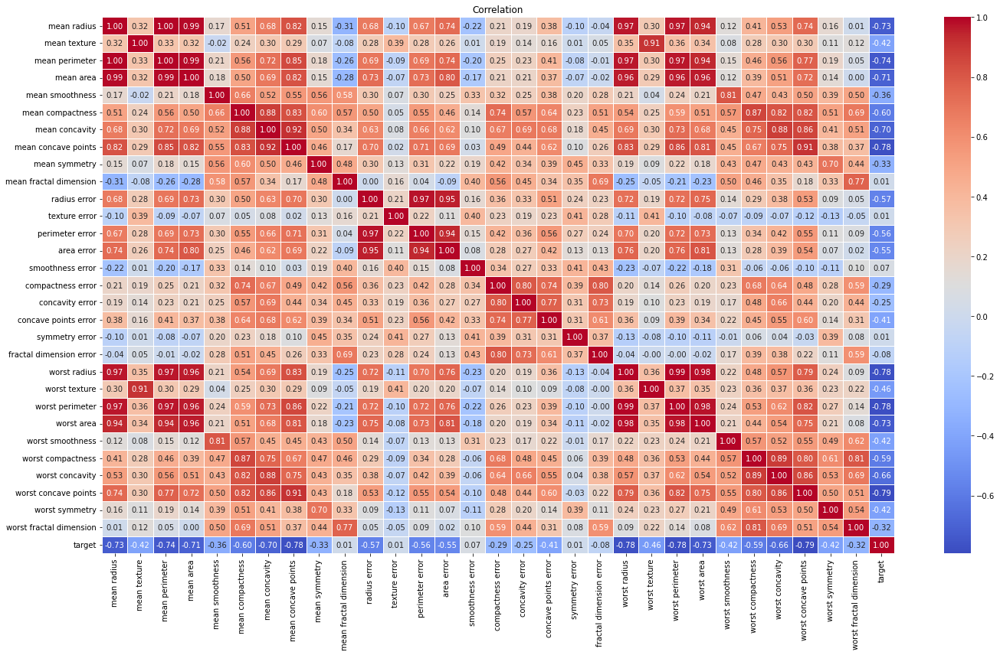

In [3]:
correlation = df.corr()
plt.figure(figsize = (20, 12))
sns.heatmap(correlation, linewidths = 1, annot = True, fmt = ".2f", cmap = 'coolwarm')
plt.title("Correlation")
plt.tight_layout()
plt.show()

### Pairplots

Визуально видно *четкую границу разделения объектов по каждой паре признаков*, откуда можно сделать вывод, что 
- для данной задачи хорошо будут подходить метрические методы классификации, т.к. выполнена **Гипотеза Компактности**.

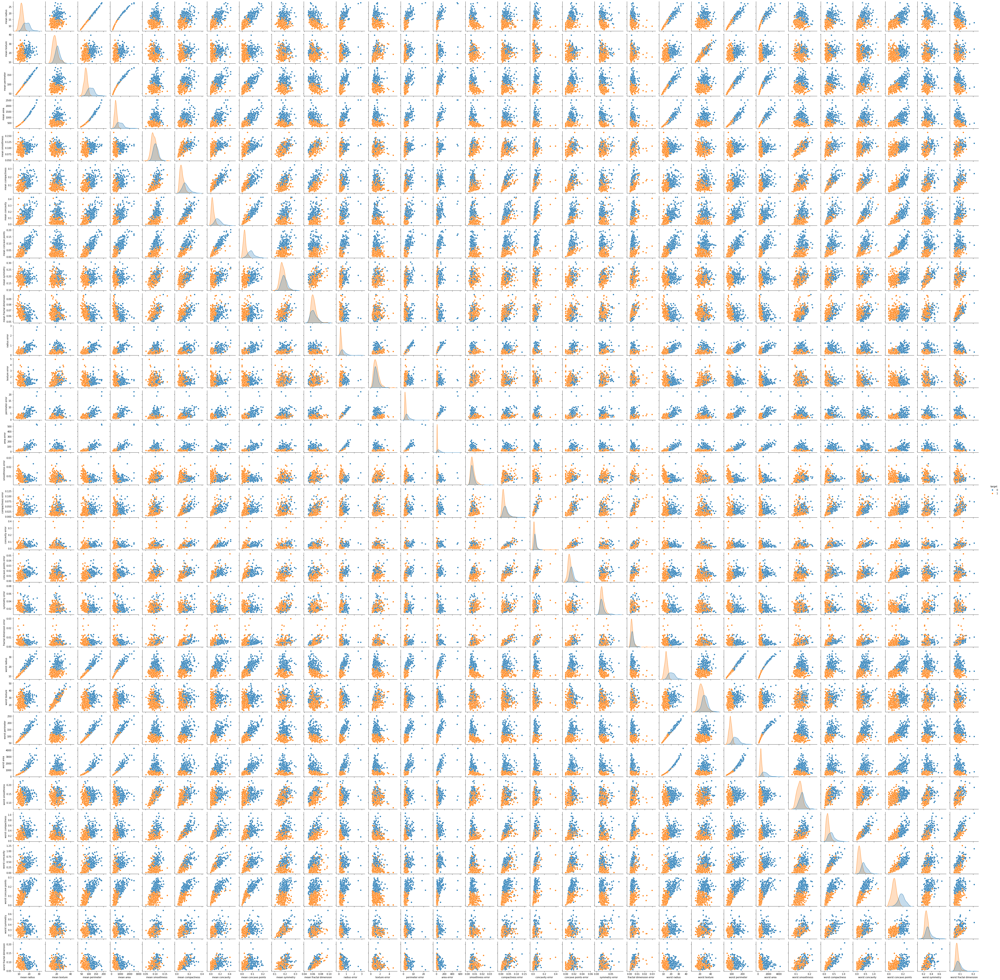

In [4]:
sns.pairplot(df, hue='target', height=2)
plt.show()

# Препроцесинг данных

## Сведение к задаче бинарной классификация со множеством ответов $Y={\{-1, 1\}}$
Закодируем классы целыми числами $-1$ и $1$:

In [6]:
dataset = df.copy()

dataset.loc[dataset['target'] == 0, dataset.columns == 'target'] = -1 
dataset.loc[dataset['target'] == 1, dataset.columns == 'target'] =  1

dataset.sample(5, random_state = 0)

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
512,13.40,20.52,88.64,556.7,0.11060,0.14690,0.14450,0.08172,0.2116,0.07325,...,29.66,113.30,844.4,0.15740,0.38560,0.51060,0.20510,0.3585,0.11090,-1
457,13.21,25.25,84.10,537.9,0.08791,0.05205,0.02772,0.02068,0.1619,0.05584,...,34.23,91.29,632.9,0.12890,0.10630,0.13900,0.06005,0.2444,0.06788,1
439,14.02,15.66,89.59,606.5,0.07966,0.05581,0.02087,0.02652,0.1589,0.05586,...,19.31,96.53,688.9,0.10340,0.10170,0.06260,0.08216,0.2136,0.06710,1
298,14.26,18.17,91.22,633.1,0.06576,0.05220,0.02475,0.01374,0.1635,0.05586,...,25.26,105.80,819.7,0.09445,0.21670,0.15650,0.07530,0.2636,0.07676,1
37,13.03,18.42,82.61,523.8,0.08983,0.03766,0.02562,0.02923,0.1467,0.05863,...,22.81,84.46,545.9,0.09701,0.04619,0.04833,0.05013,0.1987,0.06169,1


## Нормировка признаков

In [7]:
for column in dataset.columns:
    dataset[column] = dataset[column] / dataset[column].abs().max()
dataset.sample(5, random_state = 0)

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
512,0.476699,0.522403,0.470239,0.222591,0.676867,0.425304,0.338566,0.406163,0.696053,0.751745,...,0.598708,0.451035,0.198496,0.707098,0.364461,0.407827,0.704811,0.540072,0.534458,-1.0
457,0.469940,0.642821,0.446154,0.215074,0.538005,0.150695,0.064948,0.102783,0.532566,0.573071,...,0.690957,0.363416,0.148778,0.579066,0.100473,0.111022,0.206357,0.368183,0.327133,1.0
439,0.498755,0.398676,0.475279,0.242503,0.487515,0.161581,0.048899,0.131809,0.522697,0.573276,...,0.389786,0.384275,0.161942,0.464510,0.096125,0.050000,0.282337,0.321784,0.323373,1.0
298,0.507293,0.462576,0.483926,0.253139,0.402448,0.151129,0.057990,0.068290,0.537829,0.573276,...,0.509891,0.421178,0.192689,0.424304,0.204820,0.125000,0.258763,0.397108,0.369928,1.0
37,0.463536,0.468941,0.438249,0.209436,0.549755,0.109033,0.060028,0.145278,0.482566,0.601704,...,0.460436,0.336226,0.128326,0.435804,0.043658,0.038602,0.172268,0.299337,0.297301,1.0


## Создание train/test выборок

In [8]:
from sklearn.model_selection import train_test_split

X = dataset.drop(['target'], axis = 1)
Y = dataset['target']

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2, random_state = 42)

# Эксперименты для предложеных методов

In [9]:
from sklearn.model_selection import LeaveOneOut, KFold, ShuffleSplit
from sklearn.model_selection import ParameterGrid
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score

Для подбора оптимальных гипер-параметров моделей используются разные методы кросс-валидации:

In [10]:
def optimize_hyperparams(model, hyperparams, X_train, Y_train, cv = KFold(n_splits = 10)):
    '''
    Подбор гипер-параметров модели с использованием разных стратегий кросс-валидации.
    '''
    table = []
    for i, hp in enumerate(hyperparams):
        parametrized_model = model(**hp)
        table.append({
            'hyperparams' : hp,
            'score' : cross_val_score(parametrized_model, X = X_train, y = Y_train, cv = cv, scoring='accuracy').mean(),
        })

    best = max(table, key = lambda x: x['score'])
    return best, table

Далее следует проверить итоговые модели на тестовой выборке:

In [11]:
def test_model(model, best_hyperparams, X_train, Y_train, X_test, Y_test):
    '''
    Проверка моделей на тестовой выборке.
    '''
    accuracy = []
    for item in best_hyperparams:
        final_model = model(**item['hyperparams'])
        final_model.fit(X_train, Y_train)

        predictions = final_model.predict(X_test)

        accuracy.append({
            'algo' : item['algo'],
            'accuracy_score' : accuracy_score(Y_test, predictions),
        })

    return accuracy

## k-ближайших соседей

In [12]:
from sklearn.neighbors import KNeighborsClassifier

model = KNeighborsClassifier
hyperparams = ParameterGrid({'n_neighbors': range(1, 20)})

### Подбор гиперпараметров

In [13]:
best_hyperparams = []

#### KFold

In [14]:
best, table = optimize_hyperparams(model, hyperparams, X_train = X_train, Y_train = Y_train, \
                                   cv = KFold(n_splits = 10))
table

[{'hyperparams': {'n_neighbors': 1}, 'score': np.float64(0.9604347826086957)},
 {'hyperparams': {'n_neighbors': 2}, 'score': np.float64(0.9538647342995169)},
 {'hyperparams': {'n_neighbors': 3}, 'score': np.float64(0.9625120772946859)},
 {'hyperparams': {'n_neighbors': 4}, 'score': np.float64(0.96256038647343)},
 {'hyperparams': {'n_neighbors': 5}, 'score': np.float64(0.9646859903381643)},
 {'hyperparams': {'n_neighbors': 6}, 'score': np.float64(0.9648309178743961)},
 {'hyperparams': {'n_neighbors': 7}, 'score': np.float64(0.9581642512077295)},
 {'hyperparams': {'n_neighbors': 8}, 'score': np.float64(0.9648309178743961)},
 {'hyperparams': {'n_neighbors': 9}, 'score': np.float64(0.9603864734299516)},
 {'hyperparams': {'n_neighbors': 10}, 'score': np.float64(0.9604830917874396)},
 {'hyperparams': {'n_neighbors': 11}, 'score': np.float64(0.9559903381642512)},
 {'hyperparams': {'n_neighbors': 12}, 'score': np.float64(0.9582125603864734)},
 {'hyperparams': {'n_neighbors': 13}, 'score': np.f

Подобраны наилучшие гипер-параметры с помощью `KFold`:

In [15]:
best_hyperparams.append({
    'algo' : 'KFold',
    'hyperparams' : best['hyperparams'],
})

best

{'hyperparams': {'n_neighbors': 6}, 'score': np.float64(0.9648309178743961)}

#### ShuffleSplit

In [16]:
best, table = optimize_hyperparams(model, hyperparams, X_train = X_train, Y_train = Y_train, \
                                   cv = ShuffleSplit(n_splits = 5, test_size = 0.25, random_state = 0))
table

[{'hyperparams': {'n_neighbors': 1}, 'score': np.float64(0.9578947368421054)},
 {'hyperparams': {'n_neighbors': 2}, 'score': np.float64(0.9385964912280702)},
 {'hyperparams': {'n_neighbors': 3}, 'score': np.float64(0.9649122807017543)},
 {'hyperparams': {'n_neighbors': 4}, 'score': np.float64(0.9578947368421051)},
 {'hyperparams': {'n_neighbors': 5}, 'score': np.float64(0.9701754385964912)},
 {'hyperparams': {'n_neighbors': 6}, 'score': np.float64(0.9631578947368421)},
 {'hyperparams': {'n_neighbors': 7}, 'score': np.float64(0.9649122807017545)},
 {'hyperparams': {'n_neighbors': 8}, 'score': np.float64(0.9649122807017545)},
 {'hyperparams': {'n_neighbors': 9}, 'score': np.float64(0.9666666666666666)},
 {'hyperparams': {'n_neighbors': 10}, 'score': np.float64(0.9649122807017545)},
 {'hyperparams': {'n_neighbors': 11}, 'score': np.float64(0.9596491228070176)},
 {'hyperparams': {'n_neighbors': 12}, 'score': np.float64(0.9543859649122808)},
 {'hyperparams': {'n_neighbors': 13}, 'score': np

Подобраны наилучшие гипер-параметры с помощью `ShuffleSplit`:

In [17]:
best_hyperparams.append({
    'algo' : 'ShuffleSplit',
    'hyperparams' : best['hyperparams'],
})

best

{'hyperparams': {'n_neighbors': 5}, 'score': np.float64(0.9701754385964912)}

### Проверка итоговых моделей на тестовой выборке

In [18]:
best_hyperparams

[{'algo': 'KFold', 'hyperparams': {'n_neighbors': 6}},
 {'algo': 'ShuffleSplit', 'hyperparams': {'n_neighbors': 5}}]

In [19]:
test_model(model, best_hyperparams, X_train, Y_train, X_test, Y_test)

[{'algo': 'KFold', 'accuracy_score': 0.956140350877193},
 {'algo': 'ShuffleSplit', 'accuracy_score': 0.956140350877193}]

## SVM

In [20]:
from sklearn.svm import SVC

model = SVC
hyperparams = ParameterGrid({'C': [1e-4, 1e-3, 1e-2, .1,],
                             'kernel': ['linear', 'poly', 'rbf'],
                             'gamma': [0.03, 0.05, 0.1, 0.2]})

### Подбор гиперпараметров

In [21]:
best_hyperparams = []

#### KFold

In [22]:
best, table = optimize_hyperparams(model, hyperparams, X_train = X_train, Y_train = Y_train, \
                                   cv = KFold(n_splits = 10))
table

[{'hyperparams': {'C': 0.0001, 'gamma': 0.03, 'kernel': 'linear'},
  'score': np.float64(0.6283091787439614)},
 {'hyperparams': {'C': 0.0001, 'gamma': 0.03, 'kernel': 'poly'},
  'score': np.float64(0.6283091787439614)},
 {'hyperparams': {'C': 0.0001, 'gamma': 0.03, 'kernel': 'rbf'},
  'score': np.float64(0.6283091787439614)},
 {'hyperparams': {'C': 0.0001, 'gamma': 0.05, 'kernel': 'linear'},
  'score': np.float64(0.6283091787439614)},
 {'hyperparams': {'C': 0.0001, 'gamma': 0.05, 'kernel': 'poly'},
  'score': np.float64(0.6283091787439614)},
 {'hyperparams': {'C': 0.0001, 'gamma': 0.05, 'kernel': 'rbf'},
  'score': np.float64(0.6283091787439614)},
 {'hyperparams': {'C': 0.0001, 'gamma': 0.1, 'kernel': 'linear'},
  'score': np.float64(0.6283091787439614)},
 {'hyperparams': {'C': 0.0001, 'gamma': 0.1, 'kernel': 'poly'},
  'score': np.float64(0.6283091787439614)},
 {'hyperparams': {'C': 0.0001, 'gamma': 0.1, 'kernel': 'rbf'},
  'score': np.float64(0.6283091787439614)},
 {'hyperparams': {'

Подобраны наилучшие гипер-параметры с помощью `KFold`:

In [23]:
best_hyperparams.append({
    'algo' : 'KFold',
    'hyperparams' : best['hyperparams'],
})

best

{'hyperparams': {'C': 0.1, 'gamma': 0.03, 'kernel': 'linear'},
 'score': np.float64(0.9404830917874397)}

#### ShuffleSplit

In [24]:
best, table = optimize_hyperparams(model, hyperparams, X_train = X_train, Y_train = Y_train, \
                                   cv = ShuffleSplit(n_splits = 5, test_size = 0.25, random_state = 0))
table

[{'hyperparams': {'C': 0.0001, 'gamma': 0.03, 'kernel': 'linear'},
  'score': np.float64(0.6263157894736842)},
 {'hyperparams': {'C': 0.0001, 'gamma': 0.03, 'kernel': 'poly'},
  'score': np.float64(0.6263157894736842)},
 {'hyperparams': {'C': 0.0001, 'gamma': 0.03, 'kernel': 'rbf'},
  'score': np.float64(0.6263157894736842)},
 {'hyperparams': {'C': 0.0001, 'gamma': 0.05, 'kernel': 'linear'},
  'score': np.float64(0.6263157894736842)},
 {'hyperparams': {'C': 0.0001, 'gamma': 0.05, 'kernel': 'poly'},
  'score': np.float64(0.6263157894736842)},
 {'hyperparams': {'C': 0.0001, 'gamma': 0.05, 'kernel': 'rbf'},
  'score': np.float64(0.6263157894736842)},
 {'hyperparams': {'C': 0.0001, 'gamma': 0.1, 'kernel': 'linear'},
  'score': np.float64(0.6263157894736842)},
 {'hyperparams': {'C': 0.0001, 'gamma': 0.1, 'kernel': 'poly'},
  'score': np.float64(0.6263157894736842)},
 {'hyperparams': {'C': 0.0001, 'gamma': 0.1, 'kernel': 'rbf'},
  'score': np.float64(0.6263157894736842)},
 {'hyperparams': {'

In [25]:
best_hyperparams.append({
    'algo' : 'ShuffleSplit',
    'hyperparams' : best['hyperparams'],
})

best

{'hyperparams': {'C': 0.1, 'gamma': 0.03, 'kernel': 'linear'},
 'score': np.float64(0.9368421052631579)}

### Проверка итоговых моделей на тестовой выборке

In [26]:
best_hyperparams

[{'algo': 'KFold',
  'hyperparams': {'C': 0.1, 'gamma': 0.03, 'kernel': 'linear'}},
 {'algo': 'ShuffleSplit',
  'hyperparams': {'C': 0.1, 'gamma': 0.03, 'kernel': 'linear'}}]

In [27]:
test_model(model, best_hyperparams, X_train, Y_train, X_test, Y_test)

[{'algo': 'KFold', 'accuracy_score': 0.956140350877193},
 {'algo': 'ShuffleSplit', 'accuracy_score': 0.956140350877193}]

## Метод потенциальных функций

Реализацию метода потенциальных функций

In [28]:
from sklearn.linear_model import SGDClassifier
from sklearn.base import BaseEstimator
from scipy.spatial.distance import cdist

class PFM(BaseEstimator):
    
    def __init__(self, *, kernel=None, h=None):
        self.kernel = kernel
        self.h = h

    def predict(self, X):
        features = self.gammas * self.kernel(cdist(X, self.X) / self.h)   
        
        diff =   np.sum(features.T[np.where(self.Y ==  1)[0]].T, axis = -1) \
               - np.sum(features.T[np.where(self.Y == -1)[0]].T, axis = -1)
        return np.sign(diff) + (diff == 0) 
        
        np.where(answers == 0, )
        
    def fit(self, X_train, Y_train):    
        self.X = np.array(X_train)
        self.Y = np.array(Y_train)
                          
        # Для нахождения "зарядов" воспользуемся тем, что 
        # метод потенциалов - линейная модель с пересчитанными признаками.
        features = self.kernel(cdist(self.X, self.X) / self.h) 
        for j in range(len(features)):
            features[j] *= self.Y[j]
        
        sgd = SGDClassifier(shuffle = False)
        sgd.partial_fit(features, Y_train, classes = [-1, 1])
        self.gammas = sgd.coef_[0]
        
        self.is_fitted_ = True
    

In [29]:
def E(x):
    return (1 - x**2) * (np.abs(x) <= 1)

def Q(x):
    return (1 - x**2)**2 * (np.abs(x) <= 1)

model = PFM
hyperparams = ParameterGrid({'h': [0.1, 0.5, 0.65, 0.66, 0.67, 0.75, 1.00, 1.25],
                             'kernel': [E, Q]})


### Подбор гиперпараметров

In [30]:
best_hyperparams = []

#### KFold

In [31]:
best, table = optimize_hyperparams(model, hyperparams, X_train = X_train, Y_train = Y_train, \
                                   cv = KFold(n_splits = 10))
table

[{'hyperparams': {'h': 0.1, 'kernel': <function __main__.E(x)>},
  'score': np.float64(0.6283091787439614)},
 {'hyperparams': {'h': 0.1, 'kernel': <function __main__.Q(x)>},
  'score': np.float64(0.6283091787439614)},
 {'hyperparams': {'h': 0.5, 'kernel': <function __main__.E(x)>},
  'score': np.float64(0.9055555555555556)},
 {'hyperparams': {'h': 0.5, 'kernel': <function __main__.Q(x)>},
  'score': np.float64(0.9098550724637681)},
 {'hyperparams': {'h': 0.65, 'kernel': <function __main__.E(x)>},
  'score': np.float64(0.9164251207729469)},
 {'hyperparams': {'h': 0.65, 'kernel': <function __main__.Q(x)>},
  'score': np.float64(0.9229951690821256)},
 {'hyperparams': {'h': 0.66, 'kernel': <function __main__.E(x)>},
  'score': np.float64(0.9253140096618357)},
 {'hyperparams': {'h': 0.66, 'kernel': <function __main__.Q(x)>},
  'score': np.float64(0.9229951690821256)},
 {'hyperparams': {'h': 0.67, 'kernel': <function __main__.E(x)>},
  'score': np.float64(0.9274879227053141)},
 {'hyperparams

In [32]:
best_hyperparams.append({
    'algo' : 'KFold',
    'hyperparams' : best['hyperparams'],
})

best

{'hyperparams': {'h': 0.67, 'kernel': <function __main__.E(x)>},
 'score': np.float64(0.9274879227053141)}

#### ShuffleSplit

In [33]:
best, table = optimize_hyperparams(model, hyperparams, X_train = X_train, Y_train = Y_train, \
                                   cv = ShuffleSplit(n_splits = 5, test_size = 0.25, random_state = 0))
table

[{'hyperparams': {'h': 0.1, 'kernel': <function __main__.E(x)>},
  'score': np.float64(0.6263157894736842)},
 {'hyperparams': {'h': 0.1, 'kernel': <function __main__.Q(x)>},
  'score': np.float64(0.6263157894736842)},
 {'hyperparams': {'h': 0.5, 'kernel': <function __main__.E(x)>},
  'score': np.float64(0.9105263157894736)},
 {'hyperparams': {'h': 0.5, 'kernel': <function __main__.Q(x)>},
  'score': np.float64(0.9245614035087719)},
 {'hyperparams': {'h': 0.65, 'kernel': <function __main__.E(x)>},
  'score': np.float64(0.8947368421052632)},
 {'hyperparams': {'h': 0.65, 'kernel': <function __main__.Q(x)>},
  'score': np.float64(0.9210526315789472)},
 {'hyperparams': {'h': 0.66, 'kernel': <function __main__.E(x)>},
  'score': np.float64(0.8859649122807017)},
 {'hyperparams': {'h': 0.66, 'kernel': <function __main__.Q(x)>},
  'score': np.float64(0.9157894736842105)},
 {'hyperparams': {'h': 0.67, 'kernel': <function __main__.E(x)>},
  'score': np.float64(0.8912280701754385)},
 {'hyperparams

In [34]:
best_hyperparams.append({
    'algo' : 'ShuffleSplit',
    'hyperparams' : best['hyperparams'],
})

best

{'hyperparams': {'h': 0.5, 'kernel': <function __main__.Q(x)>},
 'score': np.float64(0.9245614035087719)}

### Проверка итоговых моделей на тестовой выборке

In [35]:
best_hyperparams

[{'algo': 'KFold',
  'hyperparams': {'h': 0.67, 'kernel': <function __main__.E(x)>}},
 {'algo': 'ShuffleSplit',
  'hyperparams': {'h': 0.5, 'kernel': <function __main__.Q(x)>}}]

In [36]:
test_model(model, best_hyperparams, X_train, Y_train, X_test, Y_test)

[{'algo': 'KFold', 'accuracy_score': 0.9473684210526315},
 {'algo': 'ShuffleSplit', 'accuracy_score': 0.9210526315789473}]

# Анализ полученных результатов

In [44]:
from IPython.core.display import HTML
table_css = 'table {align:left;display:block} '
HTML('<style>{}</style>'.format(table_css))

После первичной обработки датасета, задача была сведена к задаче **бинарной классификации**. 

- Визуализация данных предсказала хорошую применимость *метрических методов классификации*.
- Были рассмотрены следующие методы классификации: *метод k-средних*, *SVM*, *метод Потенциальных функций*
- Было проведено сравнение алгоритмов для подбора гипер-параметров: *KFold* и *ShuffleSplit*.
- Была проведена проверка итоговых моделей на тестовой выборке.






### Метод k-средних

| Метрика                   | KFold | ShuffleSplit |
|----------------------------|:-----:|--------------|
| n_neighbors                |   5   | 6            |
| Final accuracy              |  96%  | 96%          |

### SVM:

| Метрика                   | KFold | ShuffleSplit |
|----------------------------|:-----:|--------------|
| С                |   0.1   | 0.1            |
| gamma                |   0.03   | 0.03            |
| kernel                |   'linear'   | 'linear'            |
| Final accuracy              |  96%  | 96%          |

### Метод потенциальных функций

| Метрика                   | KFold | ShuffleSplit |
|----------------------------|:-----:|--------------|
| h                |   0.67   | 0.5            |
| kernel                |   1-x**2   | (1-x**2)**2           |
| Final accuracy              |  95%  | 92%          |

### Итоги и замечания:

- Все методы классификации показали хорошую (> 90%) точность.
- Наилучшими методами оказались *SVM* и *Метод k-средних*.
- Датасет достаточно простой для задачи бинарной классификации.

### Возникшие трудности:

- Из-за отсутствия метода Потенциальных функций в библиотеках, пришлось реализовывать этот метод для задачи бинарной классификации самостоятельно.
- Из-за довольно большого набора признаков, датасет плохо поддается визуальному анализу.